In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import re

In [2]:
console =''
with open('C:\\Users\\micha\\Documents\\Kitsat\\logs\\console.txt', 'r') as f:
    console = f.read()
console

'2023-10-17 14:23:58,322 CMD: ping\n\n2023-10-17 14:23:58,494 CMD: ping\nRX: 1\n\n2023-10-17 14:24:35,567 CMD: ping\nRX: 1\nCMD: cam_stream\n\n2023-10-17 14:24:36,286 CMD: ping\nRX: 1\nCMD: cam_stream\nRX: 86.42, 0.57, 0.03, 0.00, 0.01, 0.01, 3.58, 1.00\n\n2023-10-17 14:24:36,566 CMD: ping\nRX: 1\nCMD: cam_stream\nRX: 86.42, 0.57, 0.03, 0.00, 0.01, 0.01, 3.58, 1.00\nRX: 6152\x00\x06\x00 \n\n2023-10-17 14:24:43,995 CMD: ping\nRX: 1\nCMD: cam_stream\nRX: 86.42, 0.57, 0.03, 0.00, 0.01, 0.01, 3.58, 1.00\nRX: 6152\x00\x06\x00 \nCMD: ping\n\n2023-10-17 14:28:56,298 CMD: ping\nRX: 1\nCMD: cam_stream\nRX: 86.42, 0.57, 0.03, 0.00, 0.01, 0.01, 3.58, 1.00\nRX: 6152\x00\x06\x00 \nCMD: ping\nCMD: ping\n\n2023-10-17 14:29:23,256 CMD: ping\n\n2023-10-17 14:29:23,284 CMD: ping\nRX: 1\n\n2023-10-17 14:29:26,731 CMD: ping\nRX: 1\nCMD: cam_stream\n\n2023-10-17 14:29:27,539 CMD: ping\nRX: 1\nCMD: cam_stream\nRX: 6152\x00\x06\x00 \n\n2023-10-17 14:29:28,088 CMD: ping\nRX: 1\nCMD: cam_stream\nRX: 6152\x00\x

In [3]:
commands1 = set(re.findall(r'CMD: (\w+)', console))
commands2 = set(re.findall(r'TX: (\w+)', console))
commands1.union(commands2)

{'beep',
 'cam_get_blocks',
 'cam_get_latest',
 'cam_list',
 'cam_num_blocks',
 'cam_reset',
 'cam_stream',
 'cam_take_pic',
 'ext_start_recording',
 'ext_stop_recording',
 'filesystem_mounted',
 'get_transmission_mode',
 'get_uptime',
 'gps_fix',
 'gps_get_all',
 'gps_get_altitude',
 'gps_get_location',
 'gps_get_time',
 'gps_get_velocity',
 'gs_set_network',
 'led_off',
 'led_on',
 'led_start',
 'morse',
 'mydir_files',
 'ping',
 'print_file',
 'sd_card_connected'}

In [4]:
file = "C:\\Users\\micha\\Documents\\Kitsat\\Files\\11_07_2023_145940\\data.csv"
data = pd.read_csv(file, header=None, names=list(range(12)))
data

,0,1,2,3,4,5,6,7,8,9,10,11
0,1699367357,BMP,985.860000,25.700000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1699367357,IMU,-0.346191,1.072266,0.288696,-0.006592,-0.005371,-0.002686,-0.001221,-0.208984,0.985352,NaN
2,1699367357,EPS,94.500000,0.570000,0.010000,0.010000,0.010000,0.010000,3.370000,1.000000,NaN,NaN
3,1699367357,BMP,985.760000,25.690000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1699367357,IMU,-0.277832,1.078125,0.287506,-0.005615,-0.004639,-0.003174,-0.001709,-0.210449,0.987061,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
753,1699367416,EPS,99.870000,0.570000,0.000000,0.010000,0.000000,0.010000,3.370000,1.000000,NaN,NaN
754,1699367416,BMP,985.860000,25.690000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
755,1699367416,IMU,-0.258789,1.061523,0.292358,-0.006348,-0.003662,-0.002930,-0.001953,-0.204590,0.985107,NaN
756,1699367416,EPS,104.100000,0.570000,0.000000,0.010000,0.000000,0.010000,3.370000,2.000000,NaN,NaN


In [5]:
IMU = data[data[1] == 'IMU']

Text(0, 0.5, 'Gs')

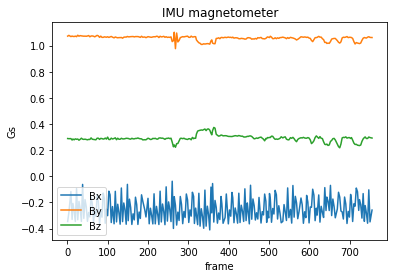

In [6]:
plt.plot(IMU[2], label='Bx')
plt.plot(IMU[3], label='By')
plt.plot(IMU[4], label='Bz')
plt.legend()
plt.title('IMU magnetometer')
plt.xlabel('frame')
plt.ylabel('Gs')


Text(0, 0.5, 'deg/s')

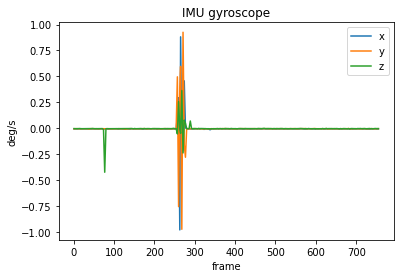

In [7]:
plt.plot(IMU[5], label='x')
plt.plot(IMU[6], label='y')
plt.plot(IMU[7], label='z')
plt.legend()
plt.title('IMU gyroscope')
plt.xlabel('frame')
plt.ylabel('deg/s')

Text(0, 0.5, '$m/s^2$')

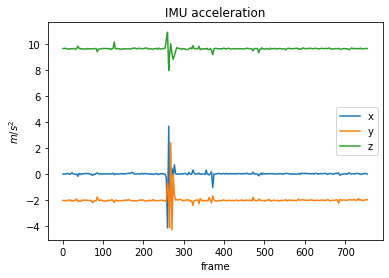

In [8]:
plt.plot(IMU[8] * 9.81, label='x')
plt.plot(IMU[9] * 9.81, label='y')
plt.plot(IMU[10] * 9.81, label='z')
plt.legend()
plt.title('IMU acceleration')
plt.xlabel('frame')
plt.ylabel(r'$m/s^2$')

In [9]:
BMP = data[data[1] == 'BMP']

Text(0, 0.5, 'hPa')

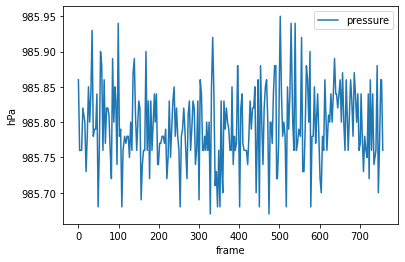

In [10]:
plt.plot(BMP[2], label='pressure')
plt.legend()
plt.xlabel('frame')
plt.ylabel('hPa')


Text(0, 0.5, '$°C$')

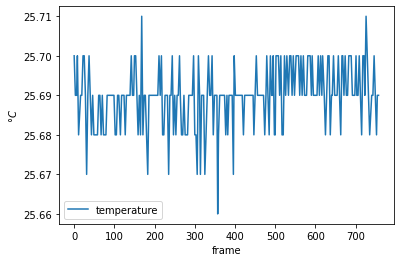

In [11]:
plt.plot(BMP[3], label='temperature')
plt.legend()
plt.xlabel('frame')
plt.ylabel(r'$°C$')


In [12]:
EPS = data[data[1] == 'EPS']

Text(0, 0.5, '$V$')

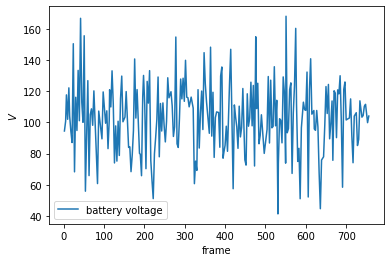

In [13]:
plt.plot(EPS[2], label='battery voltage')
plt.legend()
plt.xlabel('frame')
plt.ylabel(r'$V$')


Text(0, 0.5, '$V$')

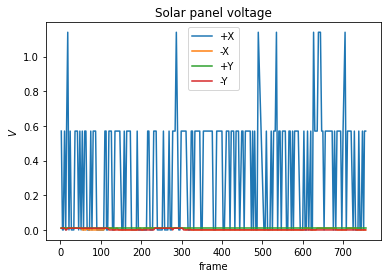

In [14]:
plt.plot(EPS[3], label='+X')
plt.plot(EPS[4], label='-X')
plt.plot(EPS[5], label='+Y')
plt.plot(EPS[6], label='-Y')
plt.legend()
plt.title("Solar panel voltage")
plt.xlabel('frame')
plt.ylabel(r'$V$')


Text(0, 0.5, '$mA$')

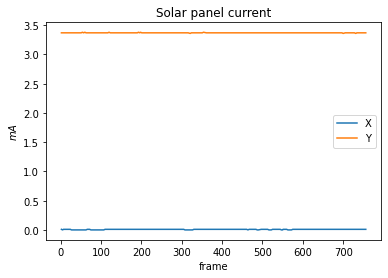

In [15]:
plt.plot(EPS[7], label='X')
plt.plot(EPS[8], label='Y')
plt.legend()
plt.title("Solar panel current")
plt.xlabel('frame')
plt.ylabel(r'$mA$')
